#Installing necessary libraries

In [ ]:
! pip install https://github.com/pandas-profiling/pandas-profiling/archive/master.zip 

In [17]:
!pip install pandas-profiling

In [ ]:
!pip install TPOT
!pip install dask==2.20.0 dask-glm==0.2.0 dask-ml==1.0.0
!pip install tornado==5.0
!pip install distributed==2.2.0
!pip install xgboost==0.90

#Importing necessary libraries

In [12]:
import pandas as pd
import numpy as np
import pandas_profiling 
from pandas_profiling import ProfileReport 
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split
#from tpot import TPOTClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PolynomialFeatures
from sklearn.feature_selection import RFE 
from sklearn.metrics import f1_score, precision_score, recall_score
from sklearn.metrics import plot_confusion_matrix

In [ ]:
#Restart the kernel 
import os
os._exit(00)

# Loading the dataset

In [13]:
telescope_data=pd.read_csv('/content/drive/MyDrive/telescope_data.csv',index_col=0)
telescope_data.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,28.7967,16.0021,2.6449,0.3918,0.1982,27.7004,22.0110,-8.2027,40.0920,81.8828,g
1,31.6036,11.7235,2.5185,0.5303,0.3773,26.2722,23.8238,-9.9574,6.3609,205.2610,g
2,162.0520,136.0310,4.0612,0.0374,0.0187,116.7410,-64.8580,-45.2160,76.9600,256.7880,g
3,23.8172,9.5728,2.3385,0.6147,0.3922,27.2107,-6.4633,-7.1513,10.4490,116.7370,g
4,75.1362,30.9205,3.1611,0.3168,0.1832,-5.5277,28.5525,21.8393,4.6480,356.4620,g


In [14]:
telescope_data.describe().T

,count,mean,std,min,25%,50%,75%,max
fLength,19020.0,53.250154,42.364855,4.2835,24.336000,37.14770,70.122175,334.1770
fWidth,19020.0,22.180966,18.346056,0.0000,11.863800,17.13990,24.739475,256.3820
fSize,19020.0,2.825017,0.472599,1.9413,2.477100,2.73960,3.101600,5.3233
fConc,19020.0,0.380327,0.182813,0.0131,0.235800,0.35415,0.503700,0.8930
fConc1,19020.0,0.214657,0.110511,0.0003,0.128475,0.19650,0.285225,0.6752
fAsym,19020.0,-4.331745,59.206062,-457.9161,-20.586550,4.01305,24.063700,575.2407
fM3Long,19020.0,10.545545,51.000118,-331.7800,-12.842775,15.31410,35.837800,238.3210
fM3Trans,19020.0,0.249726,20.827439,-205.8947,-10.849375,0.66620,10.946425,179.8510
fAlpha,19020.0,27.645707,26.103621,0.0000,5.547925,17.67950,45.883550,90.0000
fDist,19020.0,193.818026,74.731787,1.2826,142.492250,191.85145,240.563825,495.5610


In [15]:
telescope_data.describe(exclude='number')

,class
count,19020
unique,2
top,g
freq,12332


#Dataset information (Pandas Profiling)

In [16]:
profile = ProfileReport(telescope_data, title="Pandas Profiling report of telescope dataset", html={'style' : {'full_width':True}}, explorative=True)


In [17]:
profile.to_notebook_iframe()


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [ ]:
#save report in a HTML document
profile.to_file(output_file="Pandas Profiling report of telescope dataset") 

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

#Checking target incidence
the target is to classify an observation as gamma, which is the desired signal, or hadron, which is the background noise, based on the attributes provided.
 meaning that there are only 2 possible outcomes:

- g - gamma (signal)

- h - hadron (background)

In [46]:
telescope_data['class'].value_counts()

g    12332
h     6688
Name: class, dtype: int64

In [3]:
#Encoding the target column
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()
telescope_data['class'] = le.fit_transform(telescope_data['class'])

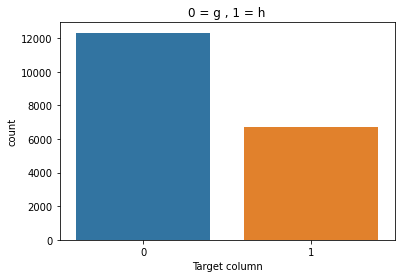

In [4]:
sns.countplot(telescope_data['class'],  data=telescope_data)
plt.title('0 = g , 1 = h')
plt.xlabel('Target column')
plt.show()

#shuffle the data

In [5]:
telescope_shuffle=telescope_data.iloc[np.random.RandomState(seed=24).permutation(len(telescope_data))]
tele=telescope_shuffle.reset_index(drop=True)
tele.head()

,fLength,fWidth,fSize,fConc,fConc1,fAsym,fM3Long,fM3Trans,fAlpha,fDist,class
0,20.7559,10.7539,2.3139,0.5825,0.3131,6.2730,-17.5199,8.4671,68.2680,138.3230,1
1,161.5550,110.2080,3.3851,0.1360,0.0698,-43.5460,-94.5333,-92.0508,58.6200,141.7730,1
2,34.8998,16.0011,2.8270,0.3619,0.1839,7.1256,16.2734,6.9719,11.5450,214.4870,0
3,27.5751,9.1894,2.4822,0.5371,0.3081,7.1629,20.1713,-8.2695,46.4810,238.7870,1
4,143.3763,30.1811,2.8094,0.3758,0.2087,-45.6603,-97.2622,21.9292,77.7655,184.7944,1


#Data preprocessing

In [6]:
#check null values
tele.isna().sum()

fLength     0
fWidth      0
fSize       0
fConc       0
fConc1      0
fAsym       0
fM3Long     0
fM3Trans    0
fAlpha      0
fDist       0
class       0
dtype: int64

In [7]:
#check duplicate values
tele.duplicated().sum()

115

In [8]:
# dropping duplicate values
tele.drop_duplicates(keep=False,inplace=True)
#check duplicate values 
tele.duplicated().sum()

0

In [9]:
# Check the Data Type
tele.dtypes

fLength     float64
fWidth      float64
fSize       float64
fConc       float64
fConc1      float64
fAsym       float64
fM3Long     float64
fM3Trans    float64
fAlpha      float64
fDist       float64
class         int64
dtype: object

In [10]:
#dataset shape 
tele.shape

(18790, 11)

Removing highly correlated feature

In [11]:
# Calculate the correlation matrix and take the absolute value
corr_matrix = tele.corr().abs()
# Create a True/False mask and apply it
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))
tele_df = corr_matrix.mask(mask)
# List column names of highly correlated features (r > 0.95)
to_drop = [c for c in tele_df.columns if any(tele_df[c] >  0.95)]
to_drop

['fConc']

In [12]:
reduced_df = tele.drop(to_drop, axis=1)
print("The reduced dataframe has {} columns.".format(reduced_df.shape[1]))

The reduced dataframe has 10 columns.


#Data Visualization

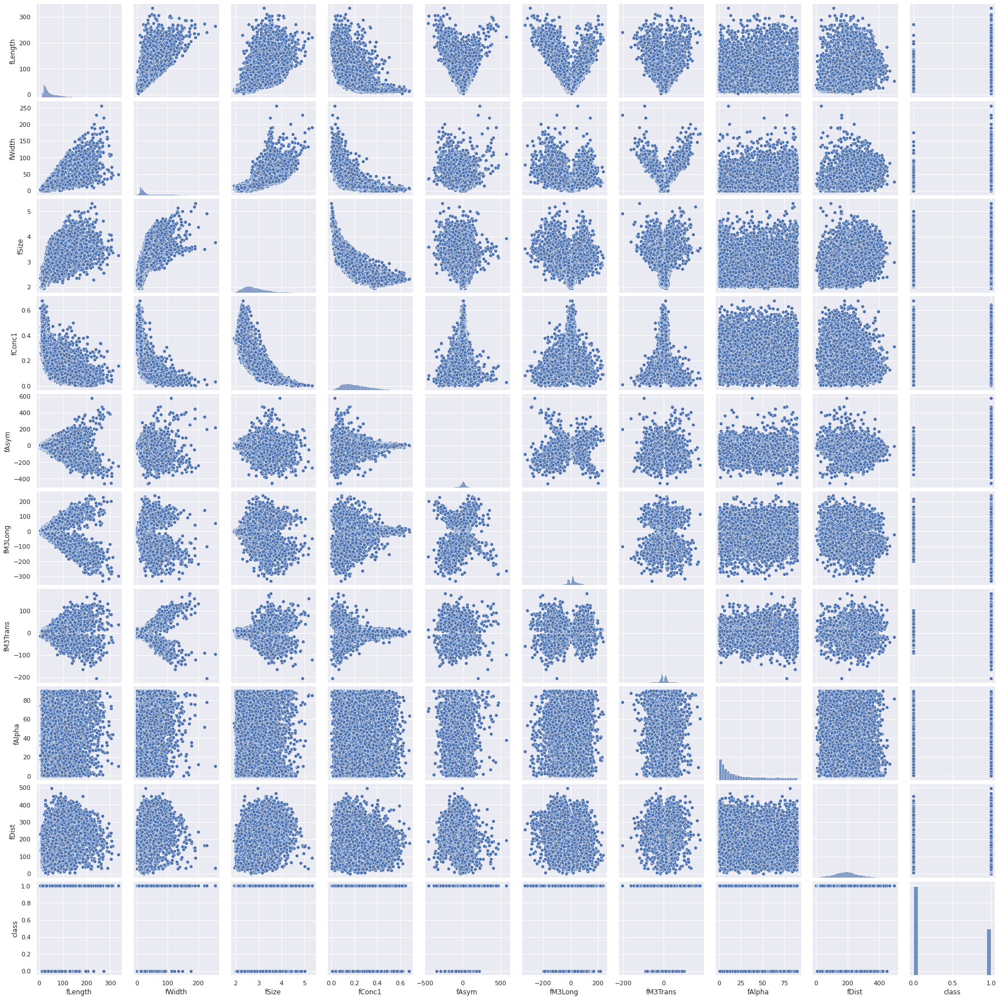

In [66]:
df = reduced_df.copy()
sns.pairplot(data=df)

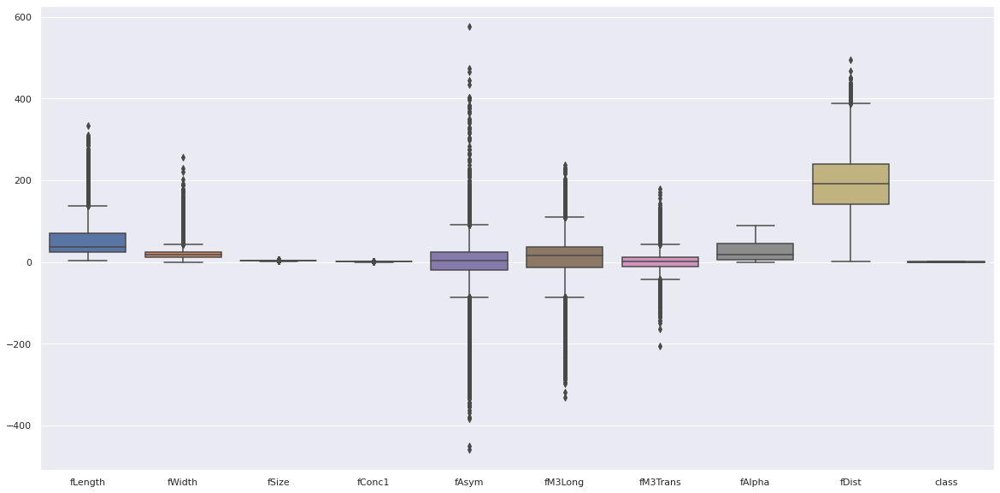

In [68]:
df = reduced_df.copy()
sns.set(style = 'darkgrid')
plt.figure(figsize = (20, 10))
ax = sns.boxplot(data=df)


#Split data into train and test datasets

In [13]:
X = reduced_df.iloc[:, 0:-1]
y =reduced_df.iloc[:, -1]

In [14]:
# make the dataset more blanced
oversample = SMOTE()
X, y = oversample.fit_resample(X, y)

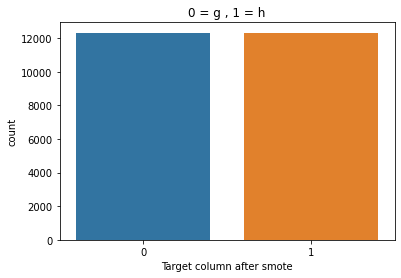

In [15]:
#make sure that the data become blanced
sns.countplot(y)
plt.title('0 = g , 1 = h')
plt.xlabel('Target column after smote')
plt.show()

In [25]:
X_train, X_test, y_train, y_test = train_test_split(X,y,train_size=0.75, test_size=0.25,random_state=24)

In [17]:
X_train.columns

Index(['fLength', 'fWidth', 'fSize', 'fConc1', 'fAsym', 'fM3Long', 'fM3Trans',
       'fAlpha', 'fDist'],
      dtype='object')

#**Modeling**

#TPOTClassifier
Using Tpot to suggest the best pipeline for these binary classification problems.


In [ ]:
tpot = TPOTClassifier(generations=3,verbosity=2)


In [ ]:
tpot.fit(X_train,y_train)

Optimization Progress:   0%|          | 0/400 [00:00<?, ?pipeline/s]


Generation 1 - Current best internal CV score: 0.879770909595727

Generation 2 - Current best internal CV score: 0.879770909595727

Generation 3 - Current best internal CV score: 0.879770909595727

Best pipeline: RandomForestClassifier(input_matrix, bootstrap=False, criterion=entropy, max_features=0.1, min_samples_leaf=4, min_samples_split=4, n_estimators=100)


TPOTClassifier(generations=3, verbosity=2)

In [ ]:
tpot.score(X_test,y_test)

0.8874472915990917

#Random Forest Classifier

In [26]:
rf_pipe = Pipeline([('transformer',  PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)),('classifier', RandomForestClassifier(criterion='entropy', random_state=0))])

In [27]:
rf_pipe.fit(X_train, y_train)

Pipeline(steps=[('transformer', PolynomialFeatures(include_bias=False)),
                ('classifier',
                 RandomForestClassifier(criterion='entropy', random_state=0))])

In [28]:
print("Accuracy: {:.2f}%".format(rf_pipe.score(X_test, y_test)*100))


Accuracy: 89.12%


In [29]:
# Generate predictions
y_pred = rf_pipe.predict(X_test)

In [30]:
# Create the confusion matrix
confusion_matrix(y_test, y_pred)

array([[2824,  271],
       [ 400, 2671]])

In [34]:
# Compute precision for the two pipelines
print("Precision of RandomForests: {}".format(precision_score(y_test, y_pred)))
print("Recall of RandomForests: {}".format(recall_score(y_test, y_pred)))

Precision of RandomForests: 0.907885791978246
Recall of RandomForests: 0.8697492673396288


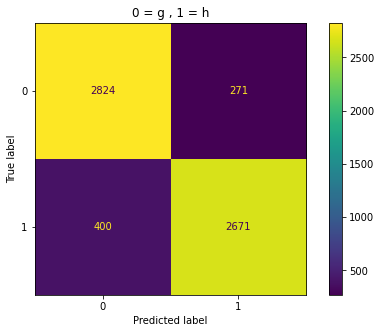

In [45]:
fig, ax = plt.subplots(figsize=(8, 5))
plt.title('0 = g , 1 = h')
plot_confusion_matrix(
    rf_pipe,  # Fitted estimator (it must have been fit)
    X_test,
    y_test,  # test sets
    ax=ax,
);

#Logistic regression
Because logistic regression is sensitive to outliers, I will use QuantileTransformer

In [37]:
lr_pipe = Pipeline([('scaler', QuantileTransformer(n_quantiles=10, random_state=0)),('transformer',  PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)),('classifier', LogisticRegression(random_state=0))])

In [38]:
lr_pipe.fit(X_train, y_train)

Pipeline(steps=[('scaler', QuantileTransformer(n_quantiles=10, random_state=0)),
                ('transformer', PolynomialFeatures(include_bias=False)),
                ('classifier', LogisticRegression(random_state=0))])

In [39]:
print("Accuracy: {:.2f}%".format(lr_pipe.score(X_test, y_test)*100))


Accuracy: 84.97%


In [40]:
# Generate predictions
y_pred = lr_pipe.predict(X_test)

In [43]:
confusion_matrix(y_test, y_pred)

array([[2742,  353],
       [ 574, 2497]])

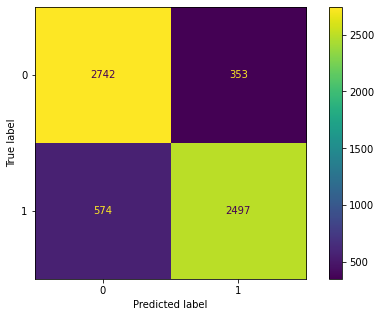

In [44]:
fig, ax = plt.subplots(figsize=(8, 5))
plot_confusion_matrix(
    lr_pipe,  # Fitted estimator (it must have been fit)
    X_test,
    y_test,  # test sets
    ax=ax,
);

In [42]:
# Compute precision for the two pipelines
print("Precision of Logistic regression: {}".format(precision_score(y_test, y_pred)))
print("Recall of Logistic regression: {}".format(recall_score(y_test, y_pred)))

Precision of Logistic regression: 0.876140350877193
Recall of Logistic regression: 0.8130901986323673


#Recursive feature elimination (RFE)
 RFE with logistic regression

In [144]:
rfe = RFE(estimator=LogisticRegression(), n_features_to_select=40, verbose=1) 
lg_rfe = LogisticRegression(random_state=24)

In [145]:
pipeline = Pipeline(steps=[('scaler', QuantileTransformer(n_quantiles=10, random_state=0)),('transformer',  PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)),('rfe',rfe),('model',lg_rfe)])


In [146]:
pipeline.fit(X_train, y_train)

Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 features.
Fitting estimator with 48 features.
Fitting estimator with 47 features.
Fitting estimator with 46 features.
Fitting estimator with 45 features.
Fitting estimator with 44 features.
Fitting estimator with 43 features.
Fitting estimator with 42 features.
Fitting estimator with 41 features.


Pipeline(steps=[('scaler', QuantileTransformer(n_quantiles=10, random_state=0)),
                ('transformer', PolynomialFeatures(include_bias=False)),
                ('rfe',
                 RFE(estimator=LogisticRegression(), n_features_to_select=40,
                     verbose=1)),
                ('model', LogisticRegression(random_state=24))])

In [147]:
print("Accuracy: {:.2f}%".format(pipeline.score(X_test, y_test)*100))


Accuracy: 84.33%


#Recursive feature elimination (RFE)

RFE with random forest

In [160]:
rfe = RFE(estimator=RandomForestClassifier(), n_features_to_select=40, verbose=1) 
rf_rfe = RandomForestClassifier(criterion='entropy', random_state=0)

In [161]:
rf_pipeline = Pipeline(steps=[('transformer',  PolynomialFeatures(degree=2, include_bias=False, interaction_only=False)),('rfe',rfe),('model',rf_rfe)])


In [162]:
rf_pipeline.fit(X_train, y_train)

Fitting estimator with 54 features.
Fitting estimator with 53 features.
Fitting estimator with 52 features.
Fitting estimator with 51 features.
Fitting estimator with 50 features.
Fitting estimator with 49 features.
Fitting estimator with 48 features.
Fitting estimator with 47 features.
Fitting estimator with 46 features.
Fitting estimator with 45 features.
Fitting estimator with 44 features.
Fitting estimator with 43 features.
Fitting estimator with 42 features.
Fitting estimator with 41 features.


Pipeline(steps=[('transformer', PolynomialFeatures(include_bias=False)),
                ('rfe',
                 RFE(estimator=RandomForestClassifier(),
                     n_features_to_select=40, verbose=1)),
                ('model',
                 RandomForestClassifier(criterion='entropy', random_state=0))])

In [163]:
print("Accuracy: {:.2f}%".format(rf_pipeline.score(X_test, y_test)*100))


Accuracy: 89.05%


In [164]:
print(dict(zip(X.columns, rfe.ranking_))) 

{'fLength': 1, 'fWidth': 1, 'fSize': 1, 'fConc1': 1, 'fAsym': 13, 'fM3Long': 1, 'fM3Trans': 15, 'fAlpha': 1, 'fDist': 1}
